<a href="https://colab.research.google.com/github/rodrigoromanguzman/Actividades_Aprendizaje-/blob/main/3_sobel_canny_edge_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 3. Sobel and Canny Edge Detection

## Table of Contents
1. [Libraries](#libraries)
2. [Sobel Edge Detection](#sobel)
3. [Canny Edge Detection](#canny)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [ ]:
import cv2
import skimage
import numpy as np
import urllib
from scipy import ndimage
from skimage import exposure
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.ndimage.filters import convolve
from scipy.ndimage.filters import gaussian_filter as gauss
from scipy.ndimage.filters import median_filter as med

## Sobel Edge Detection <a class="anchor" id="sobel" ></a>

As a first step in extracting features, you will apply the Sobel edge detection algorithm. This finds regions of the image with large gradient values in multiple directions. Regions with high omnidirectional gradient are likely to be edges or transitions in the pixel values. 

The code in the cell below applies the Sobel algorithm to the median filtered image, using these steps:

1. Convert the color image to grayscale for the gradient calculation since it is two dimensional.
2. Compute the gradient in the x and y (horizontal and vertical) directions. 
3. Compute the magnitude of the gradient.
4. Normalize the gradient values. 

In [ ]:
def edge_sobel(image):
    from scipy import ndimage
    import skimage.color as sc
    import numpy as np
    image = sc.rgb2gray(image) # Convert color image to gray scale
    dx = ndimage.sobel(image, 1)  # horizontal derivative
    dy = ndimage.sobel(image, 0)  # vertical derivative
    mag = np.hypot(dx, dy)  # magnitude
    mag *= 255.0 / np.amax(mag)  # normalize (Q&D)
    mag = mag.astype(np.uint8)
    return mag

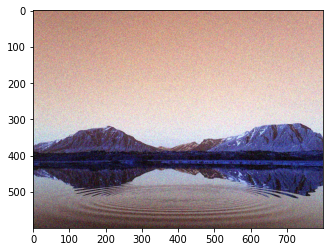

In [ ]:
url =  'https://images.unsplash.com/photo-1464278533981-50106e6176b1?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxzZWFyY2h8MjB8fG1vdW50YWluc3xlbnwwfHwwfHw%3D&auto=format&fit=crop&w=800&q=60'
urllib.request.urlretrieve(url, "mountains.jpg")
original_image = cv2.imread("mountains.jpg")

# original_image = np.load('data/img.npy')

img = skimage.util.random_noise(original_image)
plt.imshow(img)

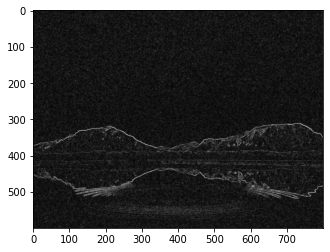

In [ ]:
img_med = med(img, size=2)
img_edge = edge_sobel(img_med)
plt.imshow(img_edge, cmap="gray")

Now let's try with the more blurred gaussian filtered image.

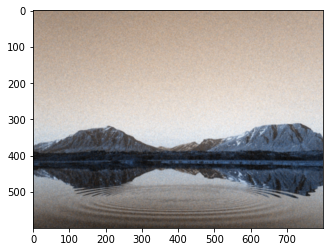

In [ ]:
img_gauss = gauss(img, sigma=1)   
plt.imshow(img_gauss)

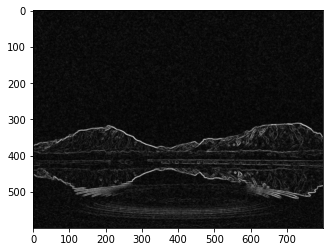

In [ ]:
img_edge = edge_sobel(img_gauss)
plt.imshow(img_edge, cmap="gray")

## Canny Edge Detection <a class="anchor" id="canny" ></a>

Steps:
1. Noise Reduction
2. Gradient Calculation
3. Non-maximum Supression
4. Double Threshold
5. Edge Tracking by Hysteresis

**Pre-requisite:** Convert the image to grayscale before algorithm.

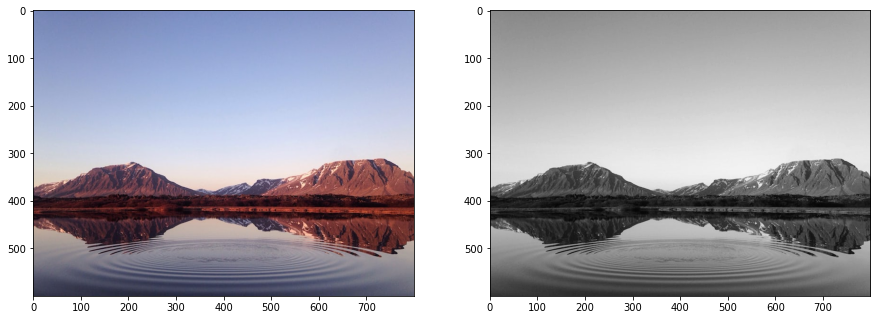

In [ ]:
img = cv2.imread('mountains.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### 1. Noise Reduction
Edge detection are highly sensitive to image noise due to the derivatives behind the algorithm.

We can apply a Gaussian Kernel, the size of the kernel depends on the expected blurring effect. The smaller the less blurring effect.

Equation for Gaussian Kernel of size $(2k+1) \times (2k+1)$

$$
H_{i, j} = \frac{1}{2\pi\sigma^2}exp(-\frac{(i-(k+1))^2 + (j-(k+1))^2}{2\sigma^2}); 1\leq i, j \leq (2k+1)
$$

In [ ]:
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

### 1.1 Sigma Parameter $\sigma$

In [ ]:
# Change this parameter
sigma = 10 # 1, 3, 5, 10, 20, ...

### 1.2 Kernel Size Parameter

In [ ]:
kernel_size = 3

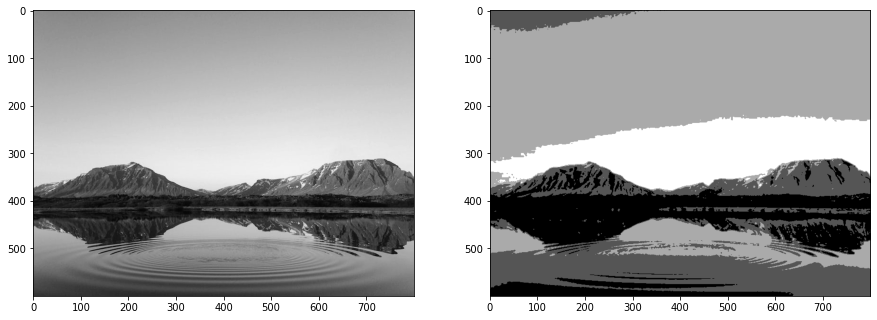

In [ ]:
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")

### 2. Gradient Calculation

Edges correspond to a change of pixels intensity. 

To detect it, the easiest way is to apply filters that highlight this intensity change in both directions: 
- horizontal $(x)$ 
- and vertical $(y)$

It can be implemented by convoling $I$ with *Sobel kernels* $Kx$ and $Ky$

$$
K_x = \begin{bmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{bmatrix}, K_y = \begin{bmatrix}
1 & 2& 1\\
0 & 0 & 0\\
-1 & -2 & -1
\end{bmatrix}
$$

Then, the magnitude $G$ and the slope $\theta$ of the gradient are calculated as follow:

$$
|G| = \sqrt{I_x^2 + I_y^2},
\theta(x, y) = arctan(\frac{I_y}{I_x})
$$

In [ ]:
def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)
    
    Ix = ndimage.filters.convolve(img, Kx)
    Iy = ndimage.filters.convolve(img, Ky)
    
    G = np.hypot(Ix, Iy)
    div_value = 1
    if(G.max()!=0):
      div_value= G.max()
    
    G = G / div_value * 255
    theta = np.arctan2(Iy, Ix)
    
    return (G, theta)

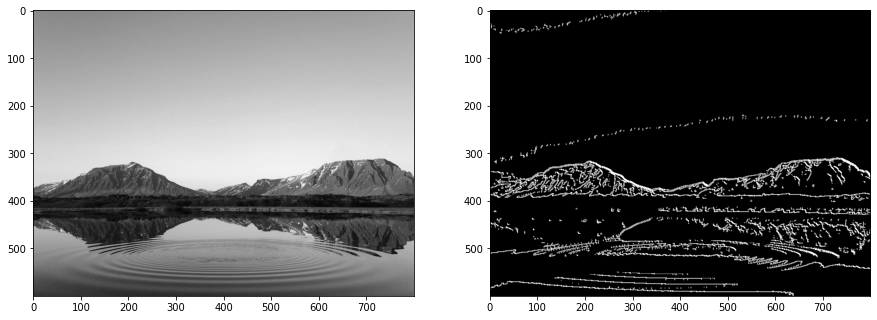

In [ ]:
G, theta = sobel_filters(img_gaussian)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
G = G.astype(np.uint8)
plt.imshow(G, cmap="gray")

### 3. Non-Maximum supression

1. Create a matrix initialized to 0 of the same size of the original gradient intensity matrix
2. Identify the edge direction based on the angle value from the angle matrix
3. Check if the pixel in the same direction has a higher intensity than the pixel that is currently processed
4. Return the image processed with the non-max suppression algorithm.

In [ ]:
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180

    
    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255
                
               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass
    
    return Z

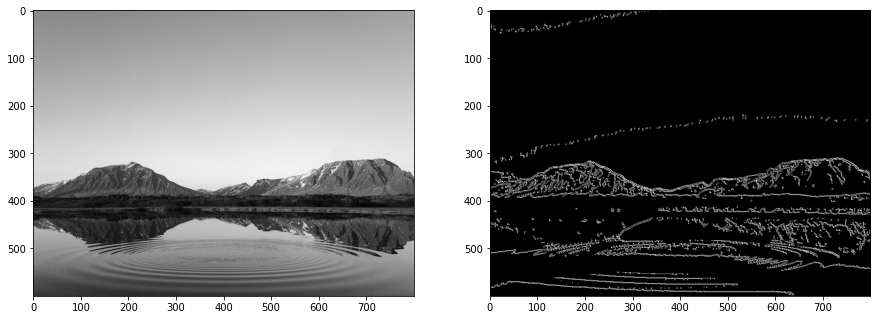

In [ ]:
img_nonmax = non_max_suppression(G, theta)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_nonmax, cmap="gray")

### 4. Double threshold

- Strong pixels are pixels that have an intensity so high that we are sure they contribute to the final edge.
- Weak pixels are pixels that have an intensity value that is not enough to be considered as strong ones, but yet not small enough to be considered as non-relevant for the edge detection.
- Other pixels are considered as non-relevant for the edge.

In [ ]:
def threshold(img, lowThresholdRatio=0.05, highThresholdRatio=0.09):
    
    highThreshold = img.max() * highThresholdRatio;
    lowThreshold = highThreshold * lowThresholdRatio;
    
    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)
    
    weak = np.int32(25)
    strong = np.int32(255)
    
    strong_i, strong_j = np.where(img >= highThreshold)
    zeros_i, zeros_j = np.where(img < lowThreshold)
    
    weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))
    
    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak
    
    return (res)

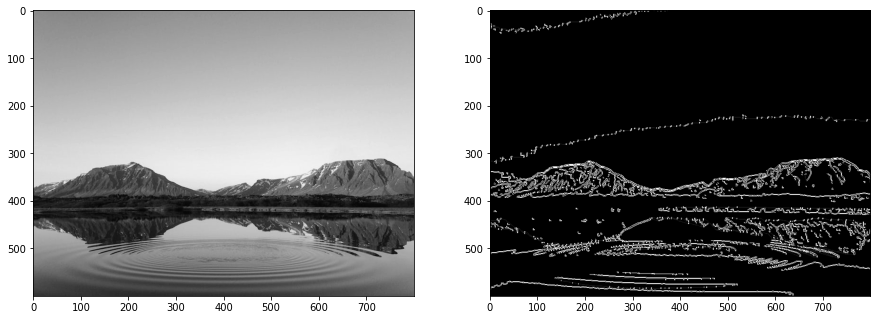

In [ ]:
img_threshold = threshold(img_nonmax)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_threshold, cmap="gray")

### 5. Edge Tracking by Hysteresis

The hysteresis consists of transforming weak pixels into strong ones, if and only if at least one of the pixels around the one being processed is a strong one

In [ ]:
def hysteresis(img, weak = 75, strong=255):
    M, N = img.shape  
    for i in range(1, M-1):
        for j in range(1, N-1):
            if (img[i,j] == weak):
                try:
                    if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                        or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                        or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                        img[i, j] = strong
                    else:
                        img[i, j] = 0
                except IndexError as e:
                    pass
    return img

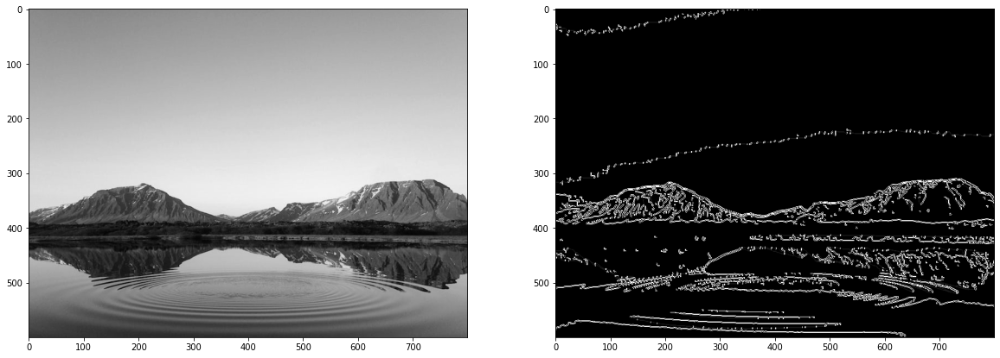

In [ ]:
img_final = hysteresis(img_threshold)

plt.figure(figsize=(20, 17))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_final, cmap="gray")

<h2>Modificacion de parametros para entrega 6.4</h2>

<h4>
a) Modifica el valor de sigma y observa lso cambios en las lineas
</h4>

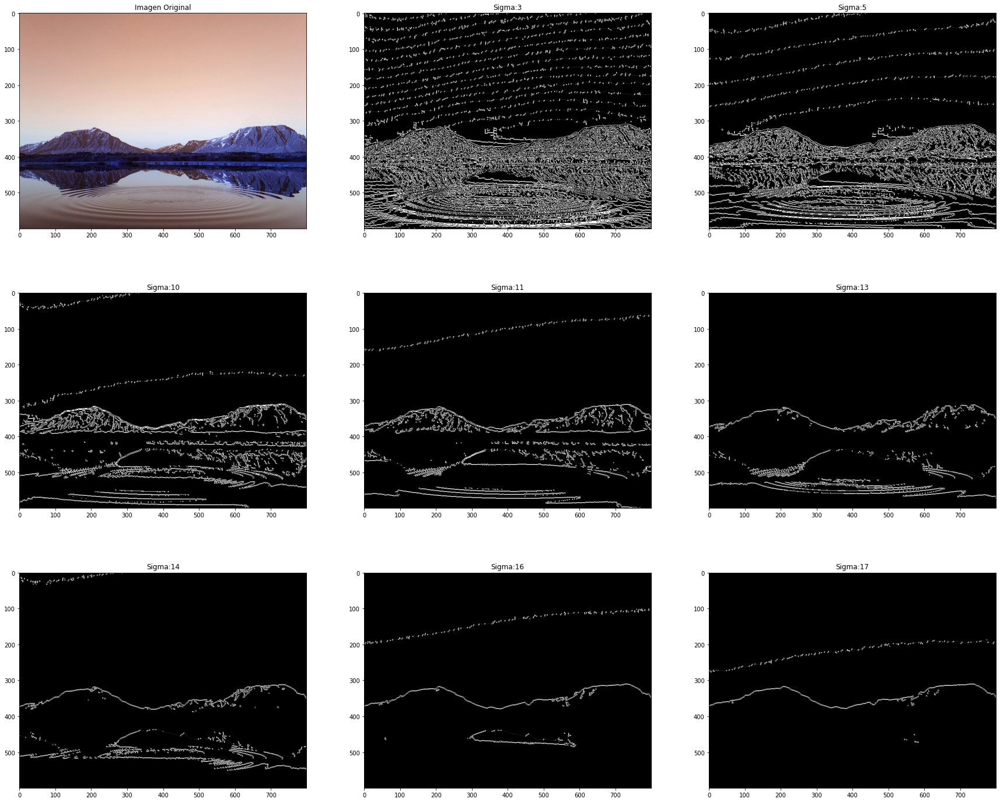

In [ ]:
#Definimos los valores de sigma que utilizaremos
sigma_values = [1,3, 5, 10, 11,13, 14,16, 17]

kernel_size = 3

canny_images = []

#Calcula todos los pasos del algorimtmo de Canny
def completeCanny(img_gray,sigma):
  #Calculamos la imagen filtrada con Gauss
  img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))
  #Aplicamos Sobel a la imagen previamente filtrada
  G, theta = sobel_filters(img_gaussian)
  #Nos aseguramos de que G es del tipo correcto
  G = G.astype(np.uint8)
  #Aplicamos suppresion
  non_max_suppressed = non_max_suppression(G,theta)
  #Aplicamos limites dobles
  img_threshold =threshold(non_max_suppressed)
  #Por ultimo aaplicamos hysteresis
  final_image = hysteresis(img_threshold)
  return final_image

#Para cada iteracion calculamos cada uno de los pasos del algoritmo de Canny
for sigma in sigma_values:
  canny_image = completeCanny(img_gray,sigma)
  #La agregamos a la lista de imagenes que sera desplegada
  canny_images.append(canny_image)

plt.figure(figsize=(30, 25))

#Definimos las dimensiones de nuestra cuadricula
row_size = 3
col_size= len(canny_images)//row_size
ctr = 2
plt.subplot(col_size, row_size, 1)
plt.imshow(original_image,cmap='gray')
plt.title('Imagen Original')
#Desplegamoz las imagenes
for y in range(1,col_size*row_size):
  plt.subplot(col_size, row_size, ctr)
  plt.imshow(canny_images[ctr-1],cmap='gray')
  plt.title('Sigma:'+str(sigma_values[ctr-1]))
  ctr+=1

Text(0.5, 1.0, 'Imagen con ruido')

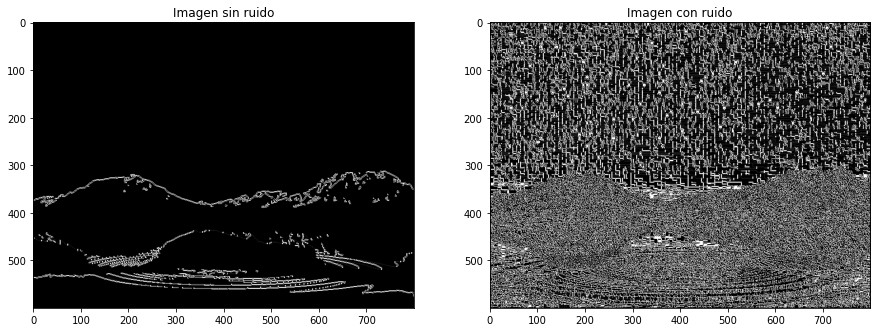

In [ ]:
original_image = cv2.imread("mountains.jpg")

#Canny aplicado a imagen sin ruido
img_gray_original = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
canny_no_noise = completeCanny(img_gray_original,13)


#Canny aplicado a imagen con ruido

#Para esto modificamos nuestra funcion de Canny y omitimos el primer paso
#de reduccion de ruido por medio del filtro Gaussiano
def incompleteCanny(img_gray):
  #Aplicamos Sobel a la imagen previamente filtrada
  G, theta = sobel_filters(img_gray)
  #Nos aseguramos de que G es del tipo correcto
  G = G.astype(np.uint8)
  #Aplicamos suppresion
  non_max_suppressed = non_max_suppression(G,theta)
  #Aplicamos limites dobles
  img_threshold =threshold(non_max_suppressed)
  #Por ultimo aaplicamos hysteresis
  final_image = hysteresis(img_threshold)
  return final_image

canny_noise = incompleteCanny(img_gray_original)


plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(canny_no_noise,cmap='gray')
plt.title('Imagen sin ruido')

plt.subplot(1, 2, 2)
plt.imshow(canny_noise,cmap='gray')
plt.title('Imagen con ruido')




<h3>Aplicamos nuestro algoritmo a imagenes de diferentes tipos con distintos valores de sigma</h3>

<h3>Diferentes tipos de imagen</h3>

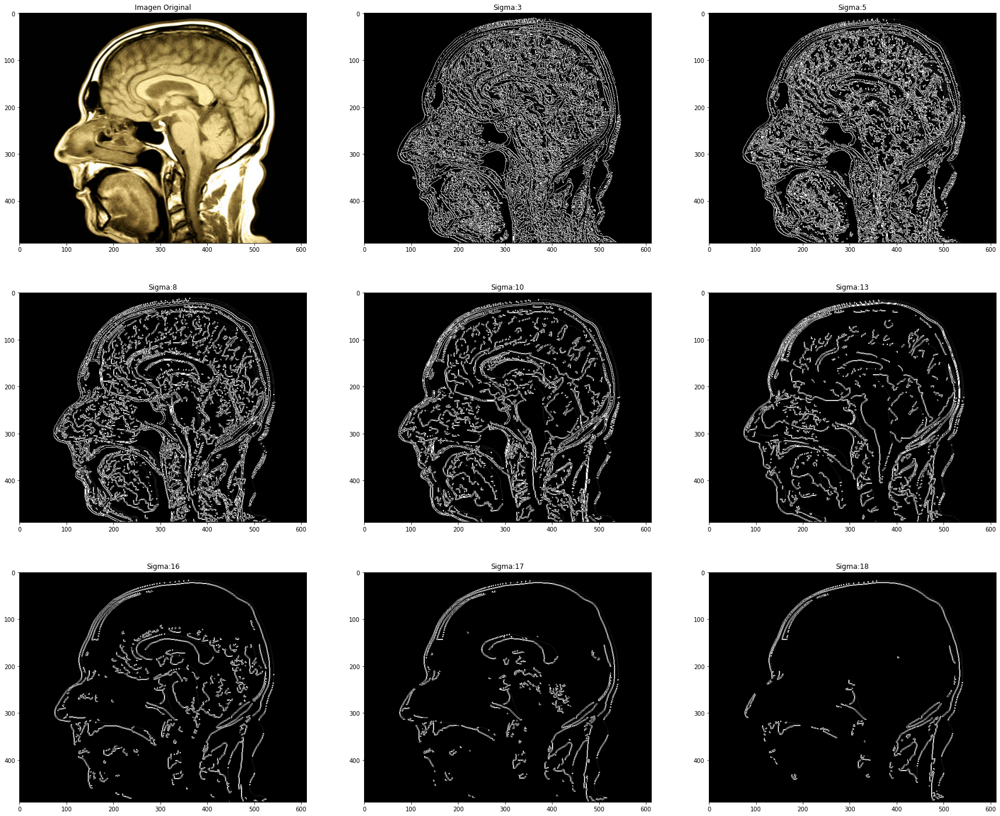

In [ ]:
#Imagen medica
url = 'https://media.istockphoto.com/id/1178580968/es/foto/resonancia-magn%C3%A9tica-rmn-del-cerebro.jpg?s=612x612&w=0&k=20&c=WRTaWtkFFyPrRxzRdhMHeo0jFtcHV80kA6mj51UT4U0='
urllib.request.urlretrieve(url, "medical.jpg")
original_image = cv2.imread("medical.jpg")

#Imagen que usaremos
img_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

#Definimos los valores de sigma que utilizaremos
sigma_values = [1,3, 5, 8, 10, 13, 16, 17, 18]

kernel_size = 3

canny_images = []

#Para cada iteracion calculamos cada uno de los pasos del algoritmo de Canny
for sigma in sigma_values:
  canny_image = completeCanny(img_gray,sigma)
  #La agregamos a la lista de imagenes que sera desplegada
  canny_images.append(canny_image)

plt.figure(figsize=(30, 25))

#Definimos las dimensiones de nuestra cuadricula
row_size = 3
col_size= len(canny_images)//row_size
ctr = 2
plt.subplot(col_size, row_size, 1)
plt.imshow(original_image,cmap='gray')
plt.title('Imagen Original')
#Desplegamoz las imagenes
for y in range(1,col_size*row_size):
  plt.subplot(col_size, row_size, ctr)
  plt.imshow(canny_images[ctr-1],cmap='gray')
  plt.title('Sigma:'+str(sigma_values[ctr-1]))
  ctr+=1




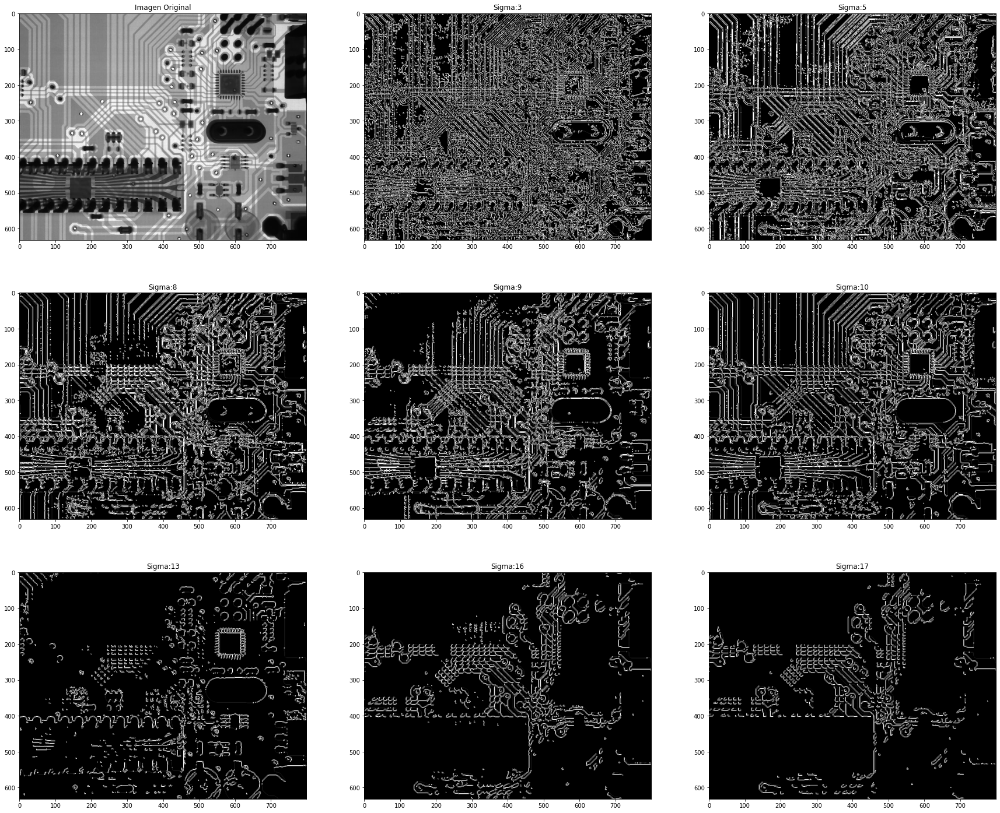

In [ ]:
#Imagen de circuito
url = 'https://images.unsplash.com/photo-1535136104956-115a2cd67fc4?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxzZWFyY2h8MTh8fHhyYXl8ZW58MHx8MHx8&auto=format&fit=crop&w=800&q=60'
urllib.request.urlretrieve(url, "circuit.jpg")
original_image = cv2.imread("circuit.jpg")

#Imagen que usaremos
img_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

#Definimos los valores de sigma que utilizaremos
sigma_values = [1,3, 5, 8,9,10, 13, 16, 17]

kernel_size = 3

canny_images = []

#Para cada iteracion calculamos cada uno de los pasos del algoritmo de Canny
for sigma in sigma_values:
  canny_image = completeCanny(img_gray,sigma)
  #La agregamos a la lista de imagenes que sera desplegada
  canny_images.append(canny_image)

plt.figure(figsize=(30, 25))

#Definimos las dimensiones de nuestra cuadricula
row_size = 3
col_size= len(canny_images)//row_size
ctr = 2
plt.subplot(col_size, row_size, 1)
plt.imshow(original_image,cmap='gray')
plt.title('Imagen Original')
#Desplegamoz las imagenes
for y in range(1,col_size*row_size):
  plt.subplot(col_size, row_size, ctr)
  plt.imshow(canny_images[ctr-1],cmap='gray')
  plt.title('Sigma:'+str(sigma_values[ctr-1]))
  ctr+=1



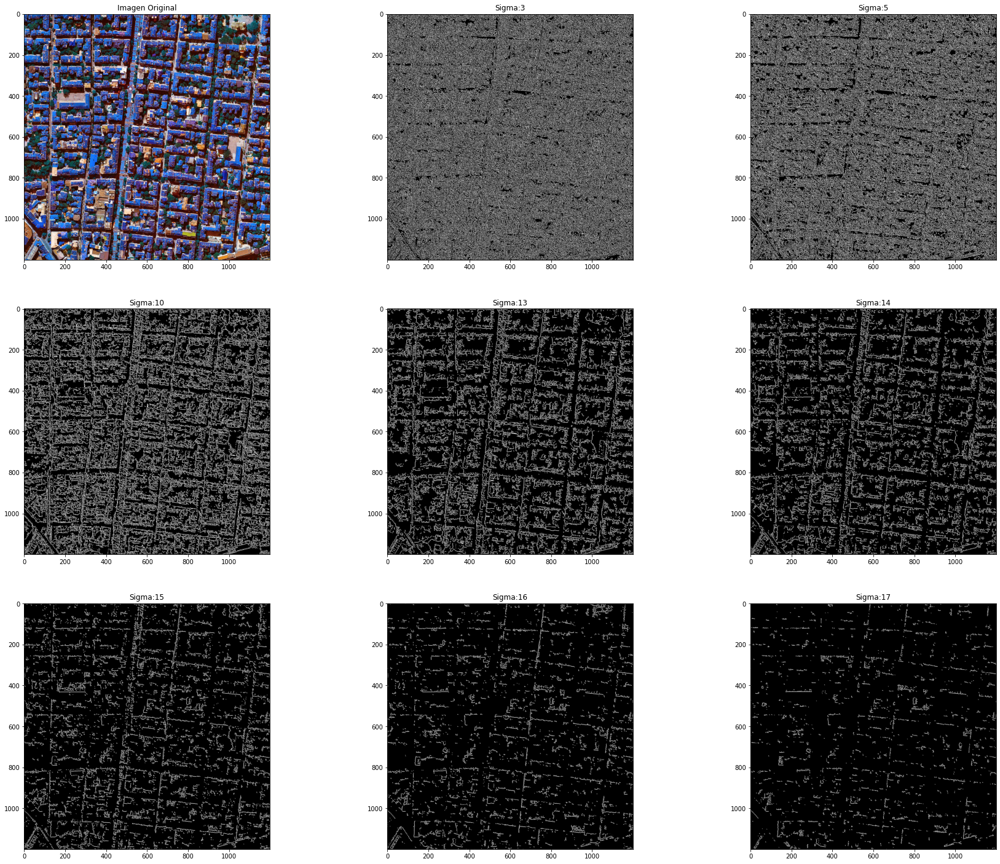

In [ ]:
#Ciudad
url = 'https://cdn.shopify.com/s/files/1/0339/0973/5483/products/8897b27794524559ae12b6e1012ebb7b_2048x.jpg?v=1589212886'

urllib.request.urlretrieve(url, "city.jpg")
original_image = cv2.imread("city.jpg")
#Imagen que usaremos
img_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

#Definimos los valores de sigma que utilizaremos
sigma_values = [1,3, 5, 10, 13, 14, 15, 16,17,18]

kernel_size = 3

canny_images = []

#Para cada iteracion calculamos cada uno de los pasos del algoritmo de Canny
for sigma in sigma_values:
  canny_image = completeCanny(img_gray,sigma)
  #La agregamos a la lista de imagenes que sera desplegada
  canny_images.append(canny_image)

plt.figure(figsize=(30, 25))

#Definimos las dimensiones de nuestra cuadricula
row_size = 3
col_size= len(canny_images)//row_size
ctr = 2
plt.subplot(col_size, row_size, 1)
plt.imshow(original_image,cmap='gray')
plt.title('Imagen Original')
#Desplegamoz las imagenes
for y in range(1,col_size*row_size):
  plt.subplot(col_size, row_size, ctr)
  plt.imshow(canny_images[ctr-1],cmap='gray')
  plt.title('Sigma:'+str(sigma_values[ctr-1]))
  ctr+=1



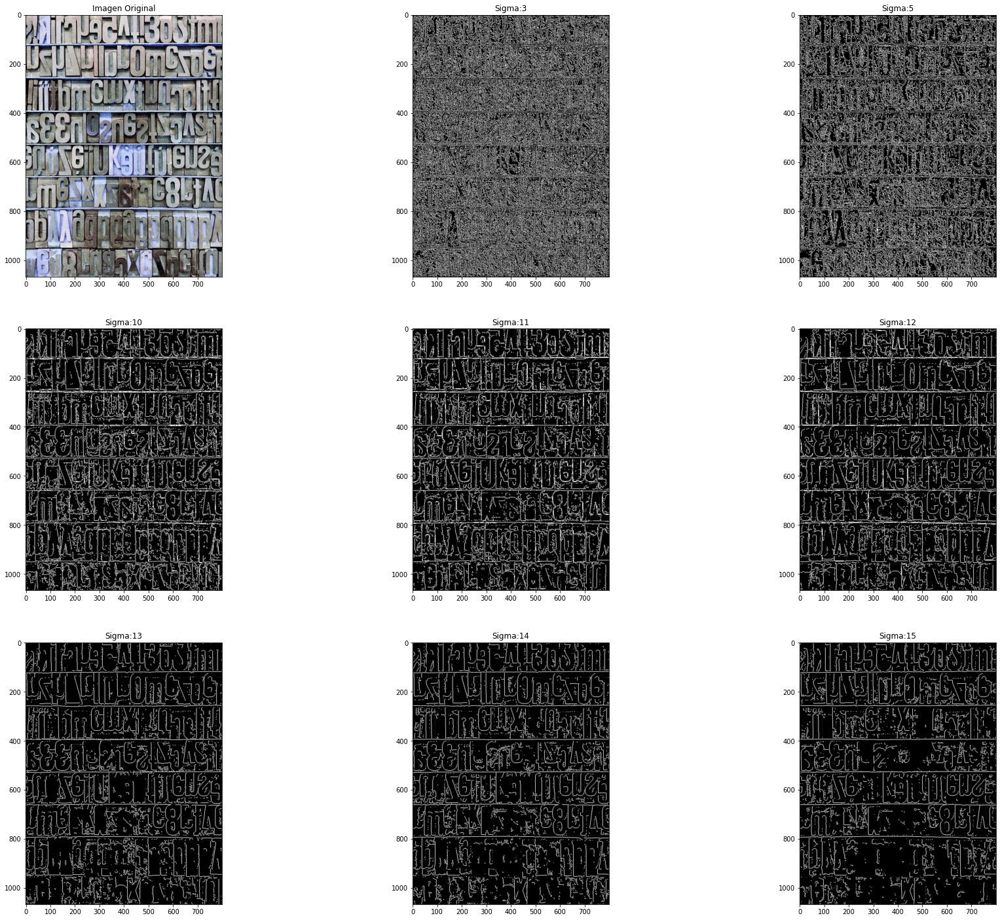

In [ ]:
#blurrry text
url = 'https://images.unsplash.com/photo-1533226458520-6f71cffeaa6a?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxzZWFyY2h8NXx8bGV0dGVyc3xlbnwwfHwwfHw%3D&auto=format&fit=crop&w=800&q=60'
urllib.request.urlretrieve(url, "blurry_text.jpg")
original_image = cv2.imread("blurry_text.jpg")
#Imagen que usaremos
img_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

#Definimos los valores de sigma que utilizaremos
sigma_values = [1,3, 5, 10, 11, 12, 13, 14,15]

kernel_size = 3

canny_images = []
#Para cada iteracion calculamos cada uno de los pasos del algoritmo de Canny
for sigma in sigma_values:
  canny_image = completeCanny(img_gray,sigma)
  #La agregamos a la lista de imagenes que sera desplegada
  canny_images.append(canny_image)

plt.figure(figsize=(30, 25))

#Definimos las dimensiones de nuestra cuadricula
row_size = 3
col_size= len(canny_images)//row_size
ctr = 2
plt.subplot(col_size, row_size, 1)
plt.imshow(original_image,cmap='gray')
plt.title('Imagen Original')
#Desplegamoz las imagenes
for y in range(1,col_size*row_size):
  plt.subplot(col_size, row_size, ctr)
  plt.imshow(canny_images[ctr-1],cmap='gray')
  plt.title('Sigma:'+str(sigma_values[ctr-1]))
  ctr+=1

<h2>Observaciones</h2>
<p>
El valor de sigma es un factor determinante en la efectividad del algoritmo, ya que la desviación estándar del filtro Gaussiano es la que determina la cantidad de suavizado que se aplica a la imagen durante el procesamiento. Es importante destacar que, para el propósito del algoritmo de detección de bordes, todos los detalles de la imagen original pueden resultar ruidosos e irrelevantes, por lo que es necesario aplicar un suavizado adecuado para obtener los bordes precisos.

Sin embargo, es crucial elegir un valor óptimo para el parámetro sigma, ya que un valor bajo implica una menor cantidad de suavizado, lo que puede resultar en una mayor fragmentación de los bordes y en una pérdida de detalles finos. Por lo tanto, para obtener un resultado óptimo con el algoritmo, se debe elegir un valor adecuado de sigma según las necesidades específicas de cada aplicación.

En algunos casos, un valor entre 13 y 16 puede ser adecuado para preservar los rasgos más importantes de la imagen, especialmente si no se requiere demasiado detalle. Por otro lado, para casos que requieren mayor granularidad, como en la detección de circuitos o trazos de ciudades, es necesario elegir valores entre 5 y 10 para obtener mayor detalle.

En resumen, la elección del valor de sigma debe ser cuidadosamente considerada para cada aplicación en particular, teniendo en cuenta la relación entre la reducción de ruido y la preservación de los detalles del borde. Es importante destacar que un valor inadecuado de sigma puede comprometer la calidad del resultado final del procesamiento de la imagen.
</p>